Imports and setup

In [1]:
import pickle
import numpy as np
from rdkit import Chem
import rdkit.Chem.QED
import torch
from coati.models.io.coati import load_e3gnn_smiles_clip_e2e
from coati.models.regression.basic_due import basic_due
from coati.common.util import batch_indexable
import csv

# This recalls a coati model
DEVICE = torch.device("cuda:0")

Load model

In [2]:
encoder, tokenizer = load_e3gnn_smiles_clip_e2e(
    freeze=True,
    device=DEVICE,
    # barlowmol
    doc_url="s3://terray-public/models/barlow_closed.pkl",
)

Loading model from s3://terray-public/models/barlow_closed.pkl
Loading tokenizer may_closedparen from s3://terray-public/models/barlow_closed.pkl
number of parameters: 12.64M
number of parameters Total: 2.44M xformer: 17.92M Total: 20.36M 
vocab_name not found in tokenizer_vocabs, trying to load from file
Freezing encoder
20561664 params frozen!


In this example, we work with a subset from the Chembl dataset.

In [3]:
import random

from coati.common.s3 import cache_read

# load Chembl dataset smile strings.
with cache_read("s3://terray-public/datasets/chembl_canonical_smiles.pkl", "rb") as f:
    chembl_canonical_smiles = pickle.loads(f.read(), encoding="UTF-8")

# for our example, we will use a small subset of the data
random.shuffle(chembl_canonical_smiles)
chembl_subset = chembl_canonical_smiles[:10_000]
chembl_subset = [{"smiles": s, "source": "chembl_mols"} for s in chembl_subset]

In [4]:
def embed_and_score_in_batches(
    records,
    encoder=encoder,
    tokenizer=tokenizer,
    batch_size=128,
    score=True,
    smiles_field="smiles",
    csv_file_path="smiles_embeddings.csv",
):
    # A helper function to compute embeddings from the model encoder and
    # rdkit properties of molecules in batches. The input list of dict records
    # is modified in place.

    print("Embedding and scoring iterable from smiles.")
    with open(csv_file_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['SMILES', 'Embeddings'])  # Write CSV header

    batch_iter = batch_indexable(records, batch_size)
    num_batches = len(records) // batch_size

    with torch.no_grad():
        for i, batch in enumerate(batch_iter):
            print(f"batch: {i}/{num_batches}")
            try:
                batch_mols = [Chem.MolFromSmiles(row[smiles_field]) for row in batch]
                batch_smiles = [Chem.MolToSmiles(m) for m in batch_mols]
                batch_tokens = torch.tensor(
                    [
                        tokenizer.tokenize_text("[SMILES]" + s + "[STOP]", pad=True)
                        if s != "*"
                        else tokenizer.tokenize_text("[SMILES]C[STOP]", pad=True)
                        for s in batch_smiles
                    ],
                    device=encoder.device,
                    dtype=torch.int,
                )
                batch_embeds = encoder.encode_tokens(batch_tokens, tokenizer)
                
                if score:
                    batch_logp = [rdkit.Chem.Crippen.MolLogP(m) for m in batch_mols]
                    batch_qed = [rdkit.Chem.QED.qed(m) for m in batch_mols]
                if len(batch) < 2:
                    batch[0]["emb_smiles"] = batch_embeds[0].detach().cpu().numpy()

                    if score:
                        batch[0]["qed"] = batch_qed[0]
                        batch[0]["logp"] = batch_logp[0]
                        batch[0]["smiles"] = batch_smiles[0]
                else:
                    for k, r in enumerate(batch):
                        batch[k]["emb_smiles"] = batch_embeds[k].detach().cpu().numpy()
                        if score:
                            batch[k]["qed"] = batch_qed[k]
                            batch[k]["logp"] = batch_logp[k]
                            batch[k]["smiles"] = batch_smiles[k]

                # Save to CSV
                with open(csv_file_path, mode='a', newline='') as file:
                    writer = csv.writer(file)
                    for k, r in enumerate(batch):
                        emb_str = np.array2string(batch_embeds[k].cpu().numpy(), separator=',', max_line_width=np.inf)
                        writer.writerow([batch_smiles[k], emb_str])
            except Exception as Ex:
                print(Ex)
                continue

For our subset, we compute the embeddings from the model encoder for the given molecule smile string and the RDKit properties: LogP and quantitative estimate of druglikeness (QED). These quantities are added to `chembl_subset` in place.

In [5]:
# embed and score the dataset in batches and in place.
embed_and_score_in_batches(chembl_subset)

Embedding and scoring iterable from smiles.
batch: 0/78
batch: 1/78
batch: 2/78
batch: 3/78
batch: 4/78
batch: 5/78
batch: 6/78
batch: 7/78
batch: 8/78
batch: 9/78
batch: 10/78
batch: 11/78
batch: 12/78
batch: 13/78
batch: 14/78
batch: 15/78
batch: 16/78
batch: 17/78
batch: 18/78
batch: 19/78
batch: 20/78
batch: 21/78
batch: 22/78
batch: 23/78
batch: 24/78
batch: 25/78
batch: 26/78
batch: 27/78
batch: 28/78
batch: 29/78
batch: 30/78
batch: 31/78
batch: 32/78
batch: 33/78
batch: 34/78
batch: 35/78
batch: 36/78
batch: 37/78
batch: 38/78
batch: 39/78
batch: 40/78
batch: 41/78
batch: 42/78
batch: 43/78
batch: 44/78
batch: 45/78
batch: 46/78
batch: 47/78
batch: 48/78
batch: 49/78
batch: 50/78
batch: 51/78
batch: 52/78
batch: 53/78
batch: 54/78
batch: 55/78
batch: 56/78
batch: 57/78
batch: 58/78
batch: 59/78
batch: 60/78
batch: 61/78
batch: 62/78
batch: 63/78
batch: 64/78
batch: 65/78
batch: 66/78
batch: 67/78
batch: 68/78
batch: 69/78
batch: 70/78
batch: 71/78
batch: 72/78
batch: 73/78
batc

Train a DUE regression model. We first regress the RDKit-calculated QED score for our subset. Please refer to `coati/models/regression/basic_due.py` for implementation details and background.

In [6]:
qed_model, qed_res = basic_due(
    chembl_subset,
    x_field="emb_smiles",
    y_field="qed",
    continue_training=True,
    steps=1e4,
)
qed_model = qed_model.to(DEVICE)

Visualize the output from the trained DUE model.

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from coati.math_tools.altair_plots import roc_plot

sns.set()
sns.set_palette("colorblind")


def get_due_plot(due_result, y_field="qed"):
    """Plots the DUE model regressed results."""

    # xs are the true values, ys are the predicted values, dys are the errors.
    xs, ys, dys = due_result

    fig, ax = plt.subplots(figsize=(11, 6))
    n_to_plot = 30000
    plt.style.use("seaborn-whitegrid")
    ax.errorbar(
        (xs[:n_to_plot]),
        (ys[:n_to_plot]),
        yerr=dys[:n_to_plot],
        fmt="o",
        color="black",
        ecolor="lightgray",
        elinewidth=3,
        capsize=0,
    )
    plt.xlabel("True " + y_field)
    plt.ylabel("Regressed " + y_field)
    plt.show()


def get_roc_plot(due_result, hit_pct=95):
    """The hit_pct is the percentile of the true values to use as a hit
    threshold for an arbitrary quantity.
    """

    Xs, Ys, dYs = due_result
    hit_thresh = np.percentile(Xs, hit_pct)

    return roc_plot(
        pd.DataFrame({"test_Y": Xs.flatten() > hit_thresh, "preds": Ys.flatten()}),
        y_true="test_Y",
        y_pred="preds",
    )

/tmp/ipykernel_1246299/4288271406.py:19: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


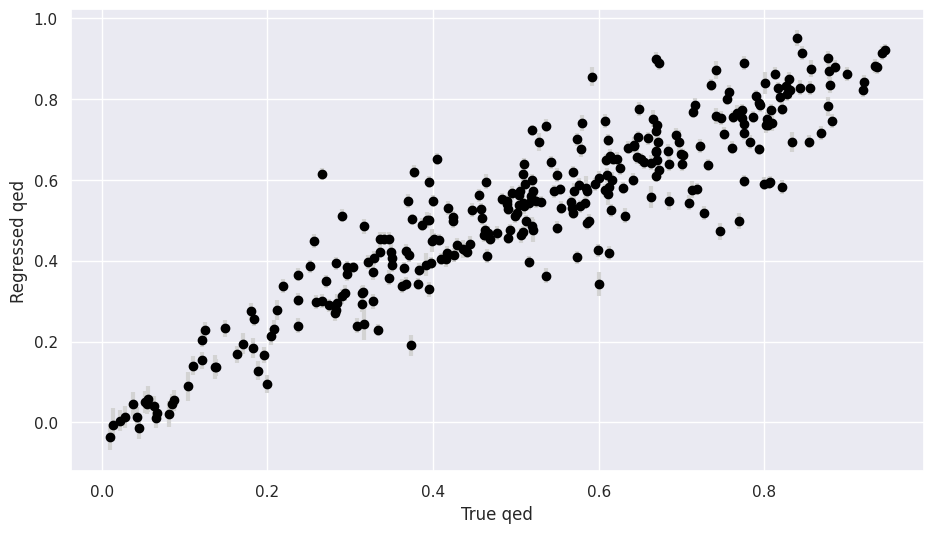

In [8]:
# uncertainties are shown as gray error bars
get_due_plot(qed_res, y_field="qed")

In [9]:
# Let's classify the top 95 percentile of QED scores as hits and generate a ROC
# curve for the model's ability to predict hits.
get_roc_plot(qed_res, hit_pct=95)

alt.Chart(...)

We can repeat the same type of regression but now for LogP property.

In [10]:
logp_model, logp_res = basic_due(
    chembl_subset,
    x_field="emb_smiles",
    y_field="logp",
    continue_training=True,
    steps=1e4,
)
logp_model = logp_model.to(DEVICE)

/tmp/ipykernel_1246299/4288271406.py:19: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


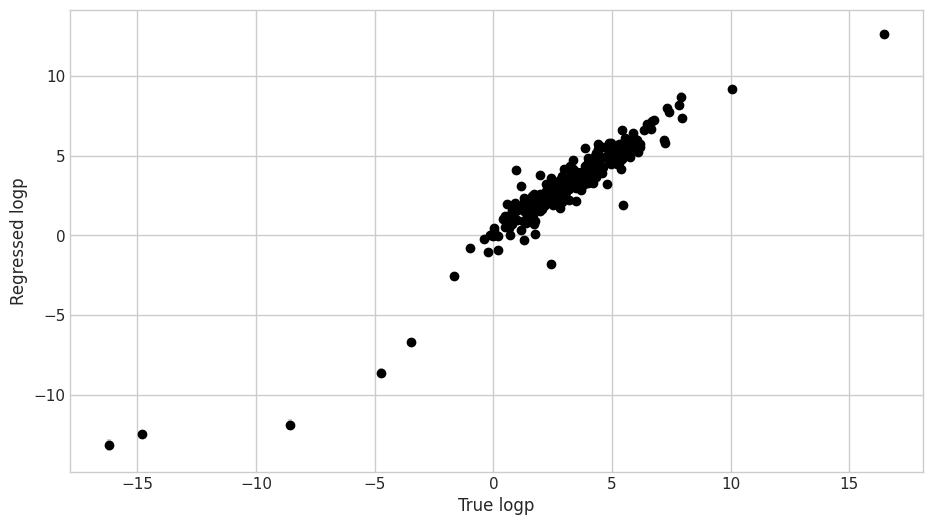

In [11]:
# uncertainties are shown as gray error bars
get_due_plot(logp_res, y_field="logp")

In [12]:
# Let's classify the top 95 percentile of logP scores as hits and generate a ROC
# curve for the model's ability to predict hits.
get_roc_plot(logp_res, hit_pct=95)

alt.Chart(...)